### In this notebook, I have tried to conduct three additional experiments using the pix2pix image translation model. 

In [14]:
import tensorflow as tf

import os
import pathlib
import time
import datetime

from matplotlib import pyplot as plt
from IPython import display
from pathlib import Path

The code below is for dataset preprocessing functions

In [36]:
BUFFER_SIZE = 400
# The batch size of 1 produced better results for the U-Net in the original pix2pix experiment
BATCH_SIZE = 1
# Each image is 256x256 in size
IMG_WIDTH = 256
IMG_HEIGHT = 256



# Normalizing the images to [-1, 1]
def normalize(input_image, real_image):
  input_image = (input_image / 127.5) - 1
  real_image = (real_image / 127.5) - 1

  return input_image, real_image

def resize(input_image, real_image, height, width):
  input_image = tf.image.resize(input_image, [height, width],
                                method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  real_image = tf.image.resize(real_image, [height, width],
                               method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

  return input_image, real_image

def load_image_pair(ct_path, mri_path):
    ct = tf.io.read_file(ct_path)
    ct = tf.image.decode_png(ct, channels=3)
    ct = tf.image.resize(ct, [256, 256])
    ct = (tf.cast(ct, tf.float32) / 127.5) - 1

    mri = tf.io.read_file(mri_path)
    mri = tf.image.decode_jpeg(mri, channels=3)
    mri = tf.image.resize(mri, [256, 256])
    mri = (tf.cast(mri, tf.float32) / 127.5) - 1

    return ct, mri



# down_model = downsample(3, 4)
# down_result = down_model(tf.expand_dims(inp, 0))
# print (down_result.shape)

def upsample(filters, size, apply_dropout=False):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
    tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                    padding='same',
                                    kernel_initializer=initializer,
                                    use_bias=False))

  result.add(tf.keras.layers.BatchNormalization())

  if apply_dropout:
      result.add(tf.keras.layers.Dropout(0.5))

  result.add(tf.keras.layers.ReLU())

  return result

def random_crop(input_image, real_image):
  stacked_image = tf.stack([input_image, real_image], axis=0)
  cropped_image = tf.image.random_crop(
      stacked_image, size=[2, IMG_HEIGHT, IMG_WIDTH, 3])

  return cropped_image[0], cropped_image[1]


@tf.function()
def random_jitter(input_image, real_image):
  # Resizing to 286x286
  input_image, real_image = resize(input_image, real_image, 286, 286)

  # Random cropping back to 256x256
  input_image, real_image = random_crop(input_image, real_image)

  if tf.random.uniform(()) > 0.5:
    # Random mirroring
    input_image = tf.image.flip_left_right(input_image)
    real_image = tf.image.flip_left_right(real_image)

  return input_image, real_image

In [37]:

def downsample(filters, size, apply_batchnorm=True):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
      tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

  if apply_batchnorm:
    result.add(tf.keras.layers.BatchNormalization())

  result.add(tf.keras.layers.LeakyReLU())

  return result


def upsample(filters, size, apply_dropout=False):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
    tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                    padding='same',
                                    kernel_initializer=initializer,
                                    use_bias=False))

  result.add(tf.keras.layers.BatchNormalization())

  if apply_dropout:
      result.add(tf.keras.layers.Dropout(0.5))

  result.add(tf.keras.layers.ReLU())

  return result

## The below code contain the model architecture definitions

### Generator

In [40]:
OUTPUT_CHANNELS = 3

#Generator

def Generator():
  inputs = tf.keras.layers.Input(shape=[256, 256, 3])

  down_stack = [
    downsample(64, 4, apply_batchnorm=False),  # (batch_size, 128, 128, 64)
    downsample(128, 4),  # (batch_size, 64, 64, 128)
    downsample(256, 4),  # (batch_size, 32, 32, 256)
    downsample(512, 4),  # (batch_size, 16, 16, 512)
    downsample(512, 4),  # (batch_size, 8, 8, 512)
    downsample(512, 4),  # (batch_size, 4, 4, 512)
    downsample(512, 4),  # (batch_size, 2, 2, 512)
    downsample(512, 4),  # (batch_size, 1, 1, 512)
  ]

  up_stack = [
    upsample(512, 4, apply_dropout=True),  # (batch_size, 2, 2, 1024)
    upsample(512, 4, apply_dropout=True),  # (batch_size, 4, 4, 1024)
    upsample(512, 4, apply_dropout=True),  # (batch_size, 8, 8, 1024)
    upsample(512, 4),  # (batch_size, 16, 16, 1024)
    upsample(256, 4),  # (batch_size, 32, 32, 512)
    upsample(128, 4),  # (batch_size, 64, 64, 256)
    upsample(64, 4),  # (batch_size, 128, 128, 128)
  ]

  initializer = tf.random_normal_initializer(0., 0.02)
  last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                         strides=2,
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='tanh')  # (batch_size, 256, 256, 3)

  x = inputs

  # Downsampling through the model
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)

  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = tf.keras.layers.Concatenate()([x, skip])

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)


generator = Generator()
tf.keras.utils.plot_model(generator, show_shapes=True, dpi=64)

You must install pydot (`pip install pydot`) for `plot_model` to work.


### Define the generator loss

GANs learn a loss that adapts to the data, while cGANs learn a structured loss that penalizes a possible structure that differs from the network output and the target image, as described in the [pix2pix paper](https://arxiv.org/abs/1611.07004).

- The generator loss is a sigmoid cross-entropy loss of the generated images and an **array of ones**.
- The pix2pix paper also mentions the L1 loss, which is a MAE (mean absolute error) between the generated image and the target image.
- This allows the generated image to become structurally similar to the target image.
- The formula to calculate the total generator loss is `gan_loss + LAMBDA * l1_loss`, where `LAMBDA = 100`. This value was decided by the authors of the paper.

In [42]:
LAMBDA = 100

loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def generator_loss(disc_generated_output, gen_output, target):
  gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

  # Mean absolute error
  l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

  total_gen_loss = gan_loss + (LAMBDA * l1_loss)

  return total_gen_loss, gan_loss, l1_loss

## Build the discriminator

The discriminator in the pix2pix cGAN is a convolutional PatchGAN classifier—it tries to classify if each image _patch_ is real or not real, as described in the [pix2pix paper](https://arxiv.org/abs/1611.07004).

- Each block in the discriminator is: Convolution -> Batch normalization -> Leaky ReLU.
- The shape of the output after the last layer is `(batch_size, 30, 30, 1)`.
- Each `30 x 30` image patch of the output classifies a `70 x 70` portion of the input image.
- The discriminator receives 2 inputs: 
    - The input image and the target image, which it should classify as real.
    - The input image and the generated image (the output of the generator), which it should classify as fake.
    - Use `tf.concat([inp, tar], axis=-1)` to concatenate these 2 inputs together.

In [43]:
def Discriminator():
  initializer = tf.random_normal_initializer(0., 0.02)

  inp = tf.keras.layers.Input(shape=[256, 256, 3], name='input_image')
  tar = tf.keras.layers.Input(shape=[256, 256, 3], name='target_image')

  x = tf.keras.layers.concatenate([inp, tar])  # (batch_size, 256, 256, channels*2)

  down1 = downsample(64, 4, False)(x)  # (batch_size, 128, 128, 64)
  down2 = downsample(128, 4)(down1)  # (batch_size, 64, 64, 128)
  down3 = downsample(256, 4)(down2)  # (batch_size, 32, 32, 256)

  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)  # (batch_size, 34, 34, 256)
  conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1)  # (batch_size, 31, 31, 512)

  batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

  leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)  # (batch_size, 33, 33, 512)

  last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2)  # (batch_size, 30, 30, 1)

  return tf.keras.Model(inputs=[inp, tar], outputs=last)


discriminator = Discriminator()
tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi=64)

You must install pydot (`pip install pydot`) for `plot_model` to work.


### Define the discriminator loss

- The `discriminator_loss` function takes 2 inputs: **real images** and **generated images**.
- `real_loss` is a sigmoid cross-entropy loss of the **real images** and an **array of ones(since these are the real images)**.
- `generated_loss` is a sigmoid cross-entropy loss of the **generated images** and an **array of zeros (since these are the fake images)**.
- The `total_loss` is the sum of `real_loss` and `generated_loss`.

In [45]:
def discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss

## Define the optimizers and a checkpoint-saver


In [46]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [65]:
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

## Generate images

Write a function to plot some images during training.

- Pass images from the test set to the generator.
- The generator will then translate the input image into the output.
- The last step is to plot the predictions and _voila_!

In [ ]:
def generate_images(model, test_input, tar):
  prediction = model(test_input, training=True)
  plt.figure(figsize=(15, 15))

  display_list = [test_input[0], tar[0], prediction[0]]
  title = ['Input Image', 'Ground Truth', 'Predicted Image']

  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    # Getting the pixel values in the [0, 1] range to plot.
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
  plt.show()


## Training

- For each example input generates an output.
- The discriminator receives the `input_image` and the generated image as the first input. The second input is the `input_image` and the `target_image`.
- Next, calculate the generator and the discriminator loss.
- Then, calculate the gradients of loss with respect to both the generator and the discriminator variables(inputs) and apply those to the optimizer.
- Finally, log the losses to TensorBoard.

In [53]:
log_dir="logs/"

summary_writer = tf.summary.create_file_writer(
  log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

In [54]:
@tf.function
def train_step(input_image, target, step):
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    gen_output = generator(input_image, training=True)

    disc_real_output = discriminator([input_image, target], training=True)
    disc_generated_output = discriminator([input_image, gen_output], training=True)

    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

  generator_gradients = gen_tape.gradient(gen_total_loss,
                                          generator.trainable_variables)
  discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator.trainable_variables)

  generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))

  with summary_writer.as_default():
    tf.summary.scalar('gen_total_loss', gen_total_loss, step=step//1000)
    tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=step//1000)
    tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=step//1000)
    tf.summary.scalar('disc_loss', disc_loss, step=step//1000)

In [55]:
def fit(train_ds, test_ds, steps):
  example_input, example_target = next(iter(test_ds.take(1)))
  start = time.time()

  for step, (input_image, target) in train_ds.repeat().take(steps).enumerate():
    if (step) % 1000 == 0:
      display.clear_output(wait=True)

      if step != 0:
        print(f'Time taken for 1000 steps: {time.time()-start:.2f} sec\n')

      start = time.time()

      generate_images(generator, example_input, example_target)
      print(f"Step: {step//1000}k")

    train_step(input_image, target, step)

    # Training step
    if (step+1) % 10 == 0:
      print('.', end='', flush=True)


    # Save (checkpoint) the model every 5k steps
    if (step + 1) % 5000 == 0:
      checkpoint.save(file_prefix=checkpoint_prefix)

### Experiment 1:  Generalization to Unseen Domains

In this experiment, I will be testing the framework’s adaptability to entirely new tasks such as medical image translation. I am using the pretrained model by importing the checkpoints and testing it on CT to MRI scan dataset. I believe the model might perform very poor in this case, so as an extension, I will try to finetune the pretrained model with the medical image dataset and see how it performs.

In [56]:
CT_PATH = Path("/mnt/e_disk/DA24S008/EE6180_Practical_Assignment/dataset/datasets/medical/testA")
MRI_PATH = Path("/mnt/e_disk/DA24S008/EE6180_Practical_Assignment/dataset/datasets/medical/testB")

CT_PATH_Train = Path("/mnt/e_disk/DA24S008/EE6180_Practical_Assignment/dataset/datasets/medical/trainA")
MRI_PATH_Train = Path("/mnt/e_disk/DA24S008/EE6180_Practical_Assignment/dataset/datasets/medical/trainB")

def get_id(f): return f.stem.lstrip("ct").lstrip("mri")

ct_dict = {get_id(f): f for f in CT_PATH.glob("*.png")}
mri_dict = {get_id(f): f for f in MRI_PATH.glob("*.jpg")}

ct_dict_train = {get_id(f): f for f in CT_PATH_Train.glob("*.png")}
mri_dict_train = {get_id(f): f for f in MRI_PATH_Train.glob("*.jpg")}

common_ids = sorted(ct_dict.keys() & mri_dict.keys())

common_ids_tr = sorted(ct_dict_train.keys() & mri_dict_train.keys())

ct_images = [str(ct_dict[i]) for i in common_ids]
mri_images = [str(mri_dict[i]) for i in common_ids]

ct_images_tr = [str(ct_dict_train[i]) for i in common_ids_tr]
mri_images_tr = [str(mri_dict_train[i]) for i in common_ids_tr]

print(f" Number of matched image pairs: {len(ct_images)}")

 Number of matched image pairs: 738


In [31]:
def load(ct_file, mri_file):
    ct_img = tf.io.read_file(ct_file)
    ct_img = tf.io.decode_jpeg(ct_img)

    mri_img = tf.io.read_file(mri_file)
    mri_img = tf.io.decode_jpeg(mri_img)

    ct_img = tf.cast(ct_img, tf.float32)
    mri_img = tf.cast(mri_img, tf.float32)

    return ct_img, mri_img



In [57]:
test_dataset = tf.data.Dataset.from_tensor_slices((ct_images, mri_images))
test_dataset = test_dataset.map(load_image_pair, num_parallel_calls=tf.data.AUTOTUNE)
test_dataset = test_dataset.batch(1)

train_dataset = tf.data.Dataset.from_tensor_slices((ct_images_tr, mri_images_tr))
train_dataset = train_dataset.map(load_image_pair, num_parallel_calls=tf.data.AUTOTUNE)
train_dataset = train_dataset.batch(1)


In [38]:
for ct_image, _ in test_dataset.take(1):  # Get the CT image (ignoring the corresponding MRI image)
    inp = ct_image[0]  # Extract the first image in the batch
    break

down_model = downsample(3, 4)
down_result = down_model(tf.expand_dims(inp, 0))
print (down_result.shape)

up_model = upsample(3, 4)
up_result = up_model(down_result)
print (up_result.shape)

I0000 00:00:1745511293.775435 3061016 cuda_dnn.cc:529] Loaded cuDNN version 90300


(1, 128, 128, 3)
(1, 256, 256, 3)


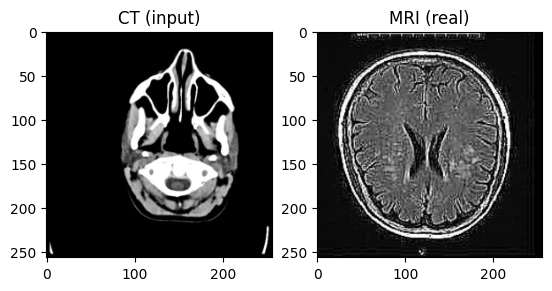

2025-04-24 21:34:24.756266: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [24]:
for inp, real in test_dataset.take(1):
    plt.subplot(1, 2, 1)
    plt.title("CT (input)")
    plt.imshow((inp[0] + 1) / 2)  # undo normalization
    plt.subplot(1, 2, 2)
    plt.title("MRI (real)")
    plt.imshow((real[0] + 1) / 2)
    plt.show()


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.071487784..0.11134837].


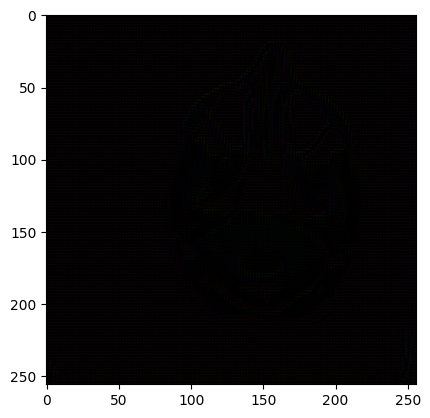

In [41]:
#Testing the generator
gen_output = generator(inp[tf.newaxis, ...], training=False)
plt.imshow(gen_output[0, ...])

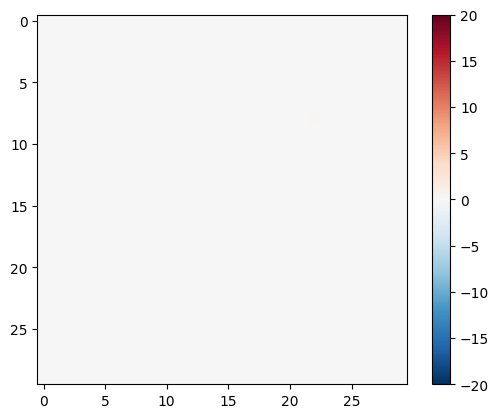

In [44]:
#testing the discriminator

disc_out = discriminator([inp[tf.newaxis, ...], gen_output], training=False)
plt.imshow(disc_out[0, ..., -1], vmin=-20, vmax=20, cmap='RdBu_r')
plt.colorbar()

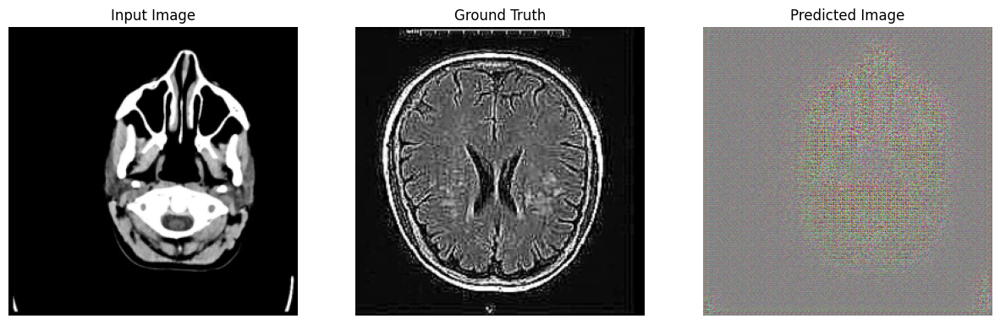

2025-04-24 21:49:57.978986: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [52]:
for example_input, example_target in test_dataset.take(1):
  generate_images(generator, example_input, example_target)

let's restore the latest checkpoint

In [58]:
!ls {checkpoint_dir}

checkpoint		    ckpt-5.data-00000-of-00001
ckpt-1.data-00000-of-00001  ckpt-5.index
ckpt-1.index		    ckpt-6.data-00000-of-00001
ckpt-2.data-00000-of-00001  ckpt-6.index
ckpt-2.index		    ckpt-7.data-00000-of-00001
ckpt-3.data-00000-of-00001  ckpt-7.index
ckpt-3.index		    ckpt-8.data-00000-of-00001
ckpt-4.data-00000-of-00001  ckpt-8.index
ckpt-4.index


In [59]:
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

### Now is the actual experiment of testing with the medical images. The model has been trained on Facades dataset.

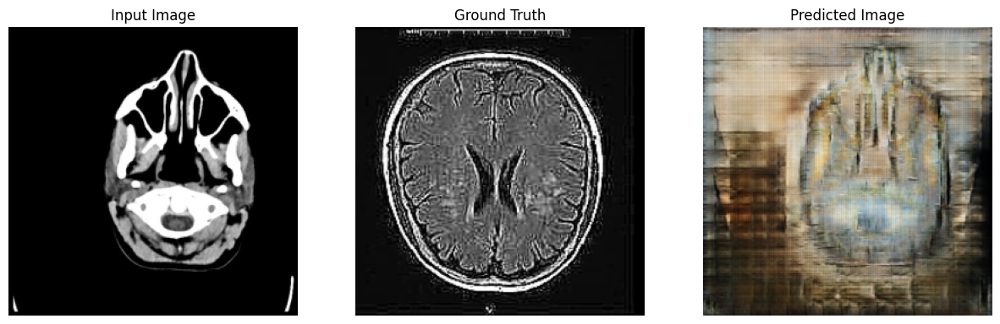

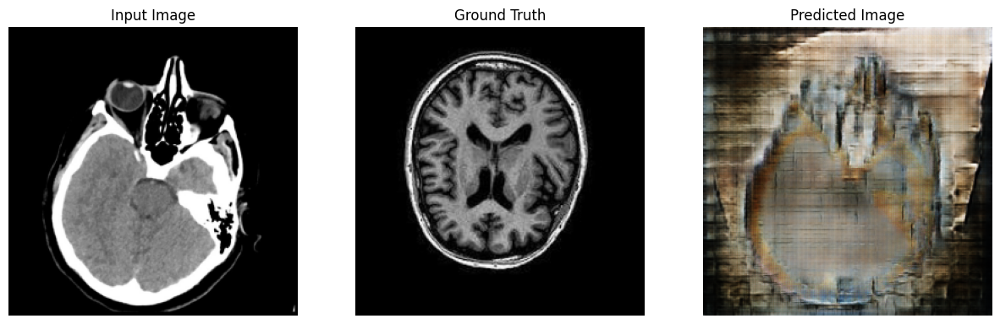

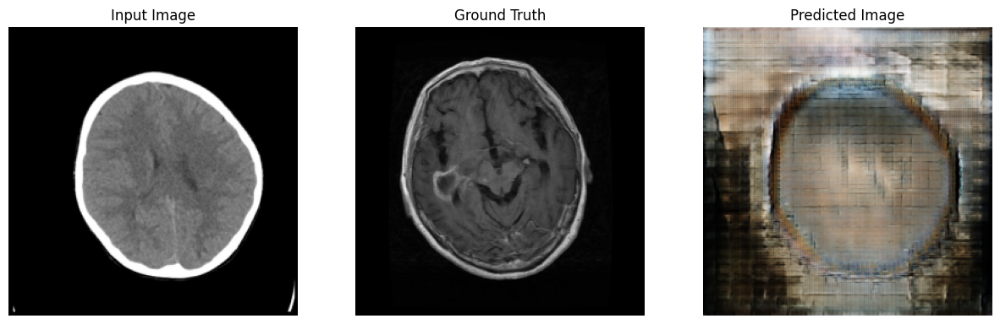

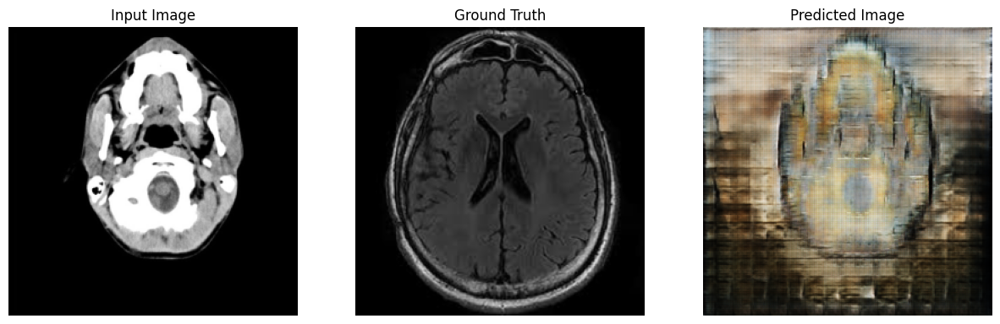

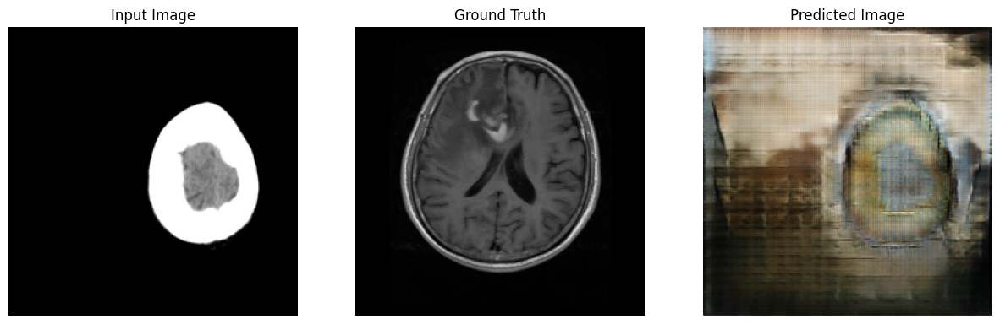

In [60]:
for inp, tar in test_dataset.take(5):
  generate_images(generator, inp, tar)

So, as I said earlier, the model was not able to perform the medical image translation. So, let's try to finetune the model for few steps 

## Training:

Time taken for 1000 steps: 14.39 sec



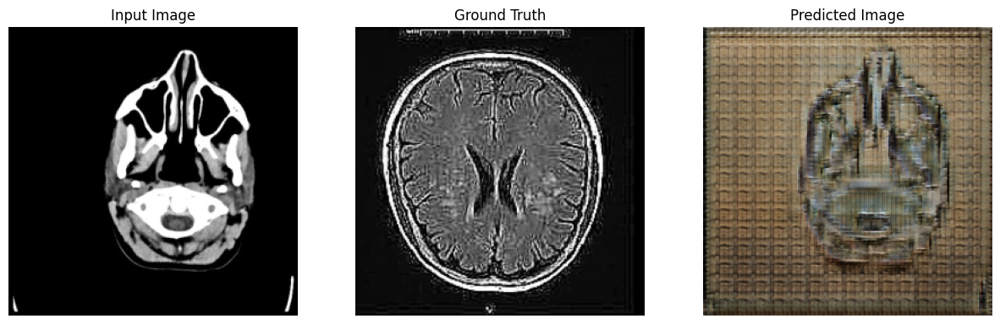

Step: 39k
....................................................................................................

In [71]:
#We will freeze the first 5 layers

for layer in generator.layers[:5]:  
    layer.trainable = False

fit(train_dataset, test_dataset, steps=40000)

In [67]:
!ls {checkpoint_dir}

checkpoint		     ckpt-3.index
ckpt-10.data-00000-of-00001  ckpt-4.data-00000-of-00001
ckpt-10.index		     ckpt-4.index
ckpt-11.data-00000-of-00001  ckpt-5.data-00000-of-00001
ckpt-11.index		     ckpt-5.index
ckpt-12.data-00000-of-00001  ckpt-6.data-00000-of-00001
ckpt-12.index		     ckpt-6.index
ckpt-13.data-00000-of-00001  ckpt-7.data-00000-of-00001
ckpt-13.index		     ckpt-7.index
ckpt-1.data-00000-of-00001   ckpt-8.data-00000-of-00001
ckpt-1.index		     ckpt-8.index
ckpt-2.data-00000-of-00001   ckpt-9.data-00000-of-00001
ckpt-2.index		     ckpt-9.index
ckpt-3.data-00000-of-00001


In [72]:
# Restoring the latest checkpoint in checkpoint_dir
generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))




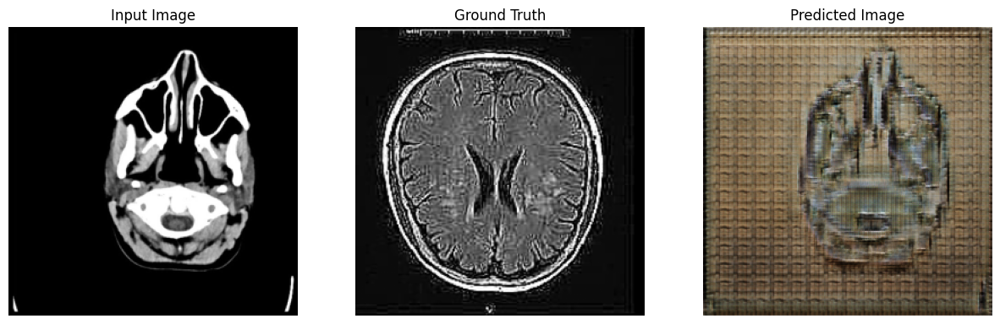

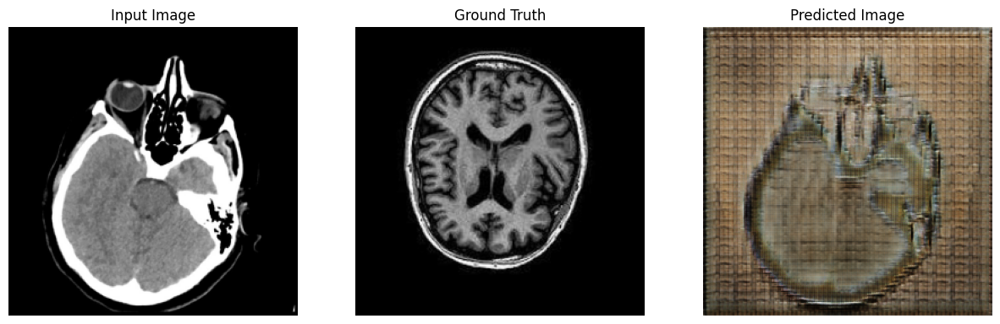

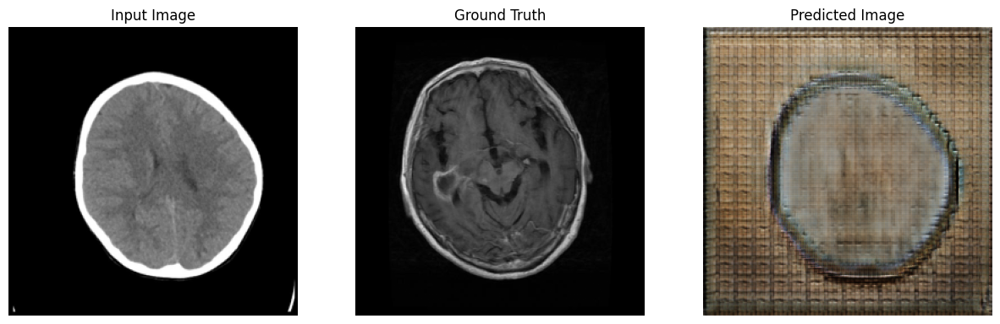

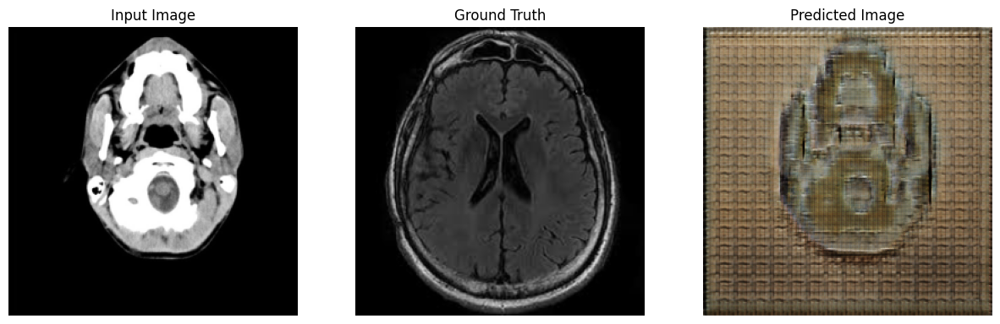

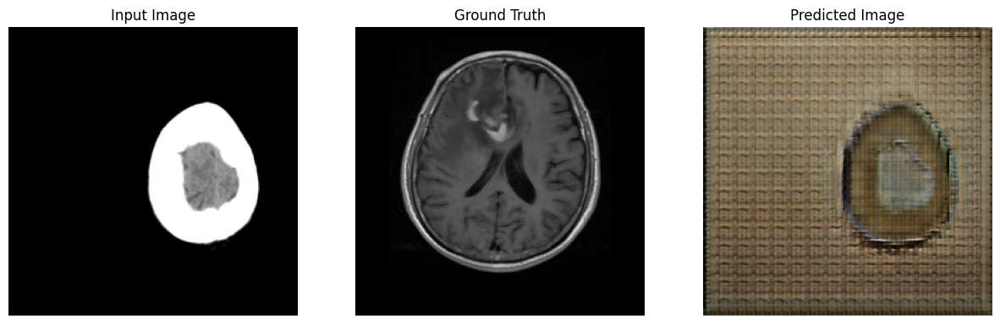

In [73]:
for inp, tar in test_dataset.take(5):
  generate_images(generator, inp, tar)

In [74]:
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

Time taken for 1000 steps: 14.43 sec



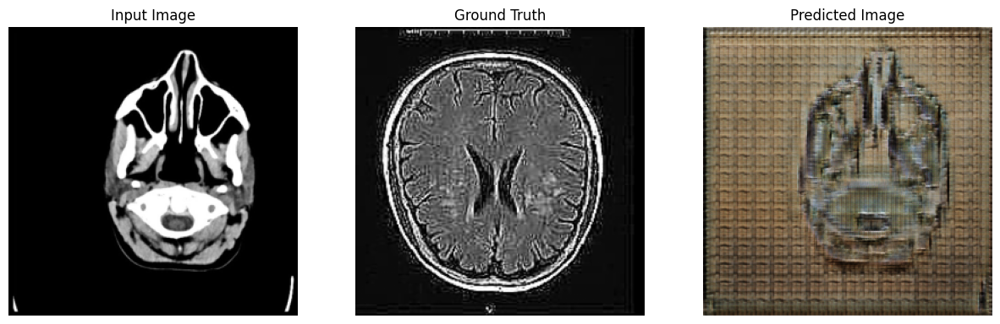

Step: 39k
....................................................................................................

In [75]:
#Now, finetuning the entire model without freezing any layers. I am using the latest checkpoint stored

fit(train_dataset, test_dataset, steps=40000)

In [76]:
generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))


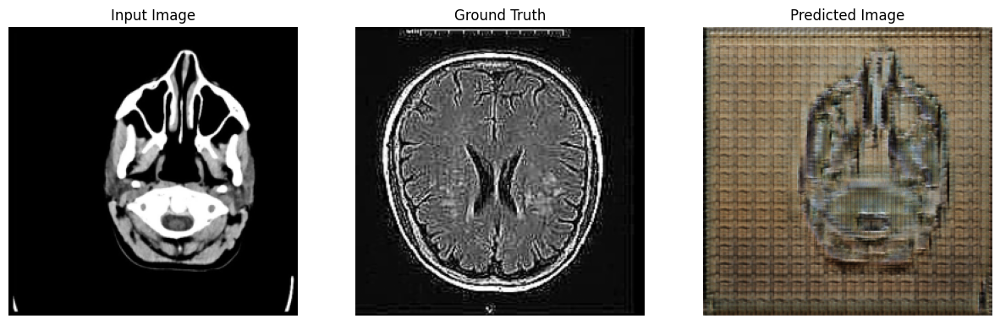

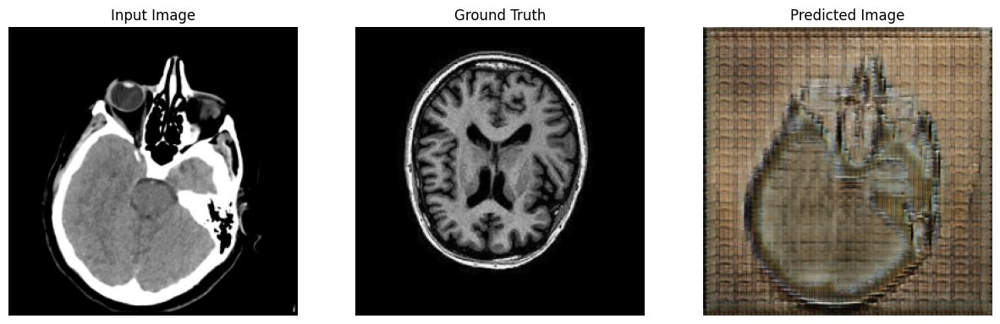

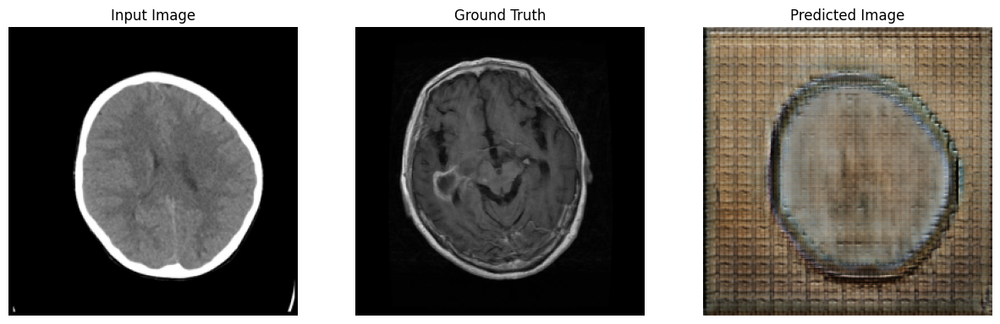

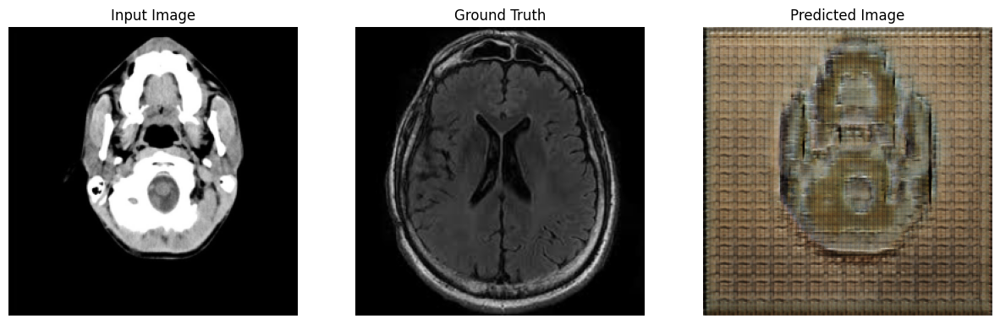

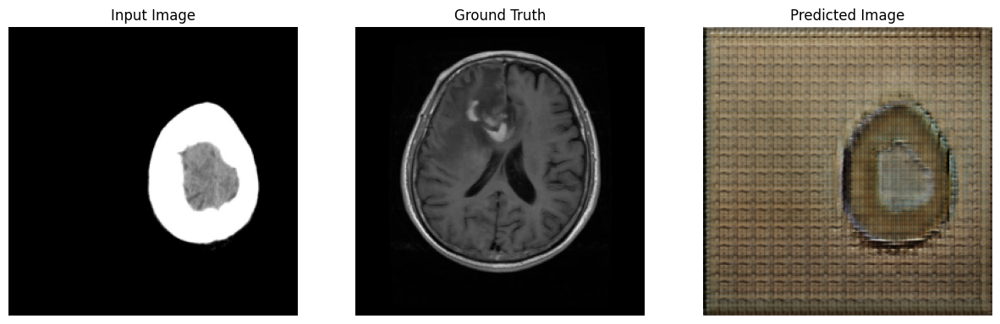

In [77]:
for inp, tar in test_dataset.take(5):
  generate_images(generator, inp, tar)